## Import Dependencies

In [1]:
import csv
from pathlib import Path
import pandas as pd
import glob
from datetime import datetime, timedelta
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
pd.set_option('display.max_columns', None)

# Read in FULL dataset to sample

In [2]:
df = pd.read_csv('data/FM_Acq2_Perf_FMAC_EPOCH1_loanAge.csv')

In [3]:
df.head()

,Unnamed: 0,id,origChannel,sellerName,origIntRate,origUPB,origLoanTerm,origDate,origLTV,origCLTV,numBorrowers,origDebtIncRatio,loanPurp,propState,zipCode,pMIperct,mortInsType,bestCreditScore,worstCreditScore,avgCreditScore,loanAge,monMatur,mSA,zeroBalCode,deliqGood,deliqBad,deliqMax,fmacRateMax,fmacRateMin,fmacRateAvg,fmacRateVolatility,fredRate,rateDiffAbove,rateDiffBelow,rateDiffAvg,rateDiffAbovePct,rateDiffBelowPct,rateDiffAvgPct
0,0,102718910405,R,"JPMORGAN CHASE BANK, NA",8.500,187000,360,2000-02-01,80.0,90.0,2.0,31.0,P,MI,483,0.0,0.0,712.0,706.0,709.0,70,290.0,19820,1.0,50,20,2.0,8.38,8.25,8.325,0.015758,6.62,0.120,-0.250,0.175,0.014320,-0.030303,0.021021
1,1,103123692845,B,"JPMORGAN CHASE BANK, NA",8.500,243000,360,2000-02-01,80.0,95.0,1.0,49.0,P,CA,926,0.0,0.0,682.0,682.0,682.0,21,339.0,31100,1.0,17,4,1.0,8.38,8.25,8.325,0.015758,6.62,0.120,-0.250,0.175,0.014320,-0.030303,0.021021
2,2,117311391991,B,"JPMORGAN CHASE BANK, NA",8.000,253000,360,2000-02-01,79.0,89.0,2.0,34.0,P,CA,953,0.0,0.0,810.0,784.0,797.0,36,324.0,44700,1.0,33,3,1.0,8.38,8.25,8.325,0.015758,6.62,-0.380,0.250,-0.325,-0.045346,0.030303,-0.039039
3,3,135950664937,R,"JPMORGAN CHASE BANK, NA",8.500,138000,360,2000-02-01,80.0,95.0,1.0,30.0,P,MA,17,0.0,0.0,718.0,718.0,718.0,16,344.0,14460,1.0,14,2,1.0,8.38,8.25,8.325,0.015758,6.62,0.120,-0.250,0.175,0.014320,-0.030303,0.021021
4,4,226095365894,B,"JPMORGAN CHASE BANK, NA",8.875,166000,360,2000-02-01,80.0,95.0,2.0,24.0,P,MA,18,0.0,0.0,782.0,752.0,767.0,24,336.0,14460,1.0,23,1,1.0,8.38,8.25,8.325,0.015758,6.62,0.495,-0.625,0.550,0.059069,-0.075758,0.066066


## Create a 5% representative sample dataset 

In [4]:
sample5 = df.sample(frac =.05)

In [5]:
sample5.shape

(113918, 38)

In [6]:
sample5.to_csv('data/FM_Acq2_Perf_FMAC_EPOCH1_loanAge_5pct.csv')

## Create a 25% representative sample dataset 

In [9]:
sample25 = df.sample(frac =.25)

In [10]:
sample25.shape

(569592, 38)

In [11]:
sample25.to_csv('data/FM_Acq2_Perf_FMAC_EPOCH1_loanAge_25pct.csv')

## 10% Sample Dataset Correlation

In [7]:
corrSample10 = sample10.corr()

Text(0.5, 1.0, 'Pearson Correlation matrix for Fannie 2019 Q1 avg Fico scores dataset')

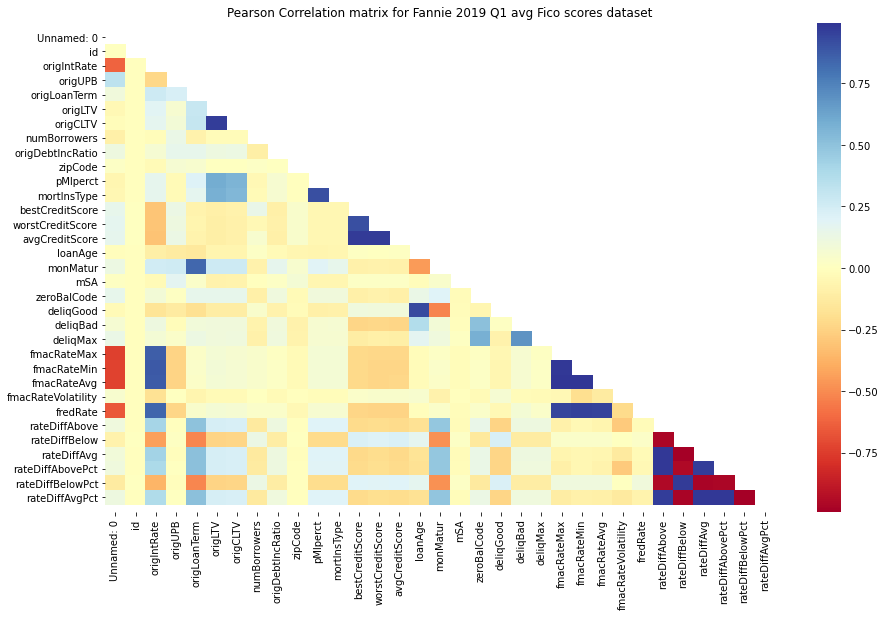

In [9]:
# Plot the Pearson Correlation reduced matrix
matrix = np.triu(corrSample10)
fig, ax = plt.subplots(figsize=(15,9)) 
ax = sns.heatmap(corrSample10,   mask = matrix, cmap = 'RdYlBu')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)
plt.title('Pearson Correlation matrix for Fannie 2019 Q1 avg Fico scores dataset')

### Eliminate "duplicate" columns to easily view potential correlations graphically

In [11]:
sample10Min = sample10.copy()

In [12]:
#Dropping columns we don't want
sample10Min.drop(['Unnamed: 0','bestCreditScore','worstCreditScore','monMatur','fmacRateMax',\
                  'fmacRateMin','fmacRateVolatility','rateDiffAbove','rateDiffBelow','rateDiffAbovePct',\
                 'rateDiffBelowPct'],1,inplace=True)

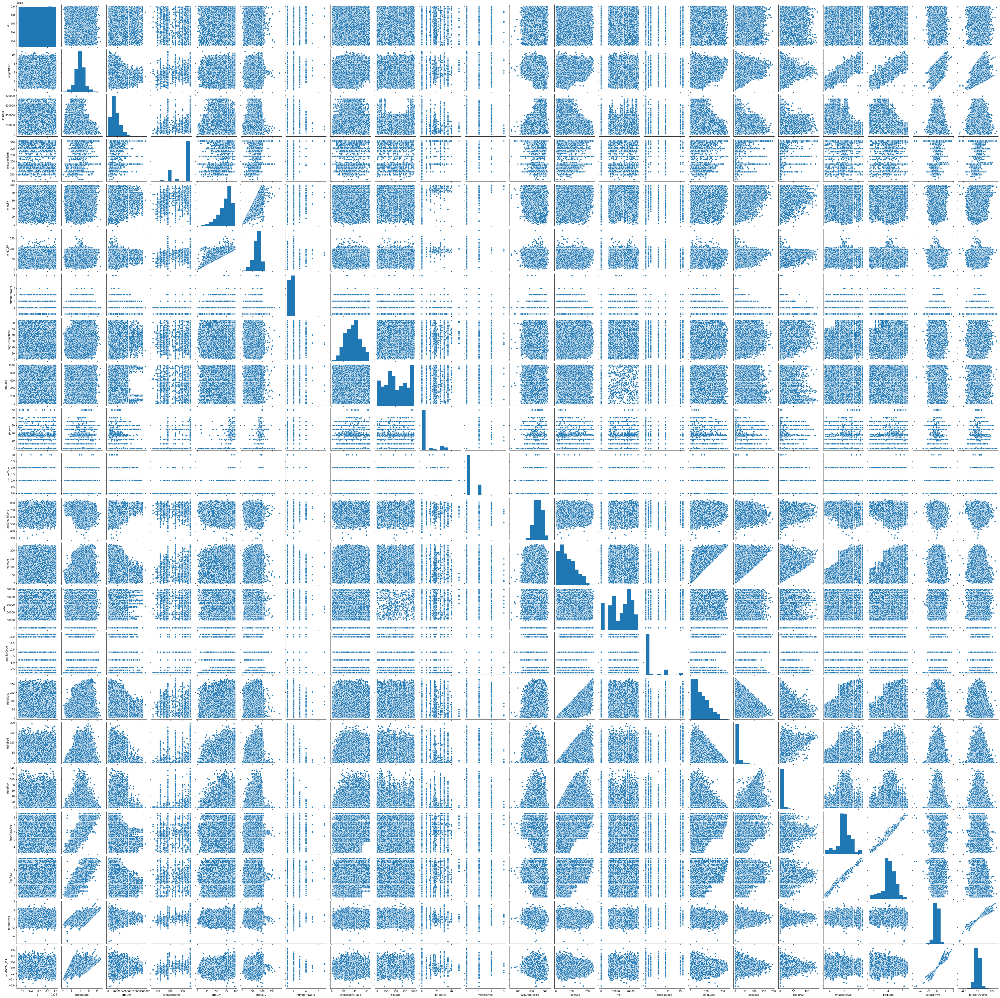

In [14]:
sns.pairplot(sample10Min)

In [66]:
pp.ProfileReport(df)

Number of variables,25
Number of observations,10464607
Total Missing (%),0.0%
Total size in memory,2.0 GiB
Average record size in memory,208.0 B
Numeric,13
Categorical,2
Boolean,0
Date,2
Text (Unique),0
Rejected,8


## Sample25 Python Profile

In [98]:
pp.ProfileReport(sample2pt5)

NameError: name 'pp' is not defined